In [2]:
import numpy as np
import pandas as pd
import math
from matplotlib import pyplot as plt
import seaborn as sns; sns.set() # sns.set() ==> グラフの見た目をseabornに合わせる


In [3]:
train_df = pd.read_csv('/home/masa/masa/feedback-prize-english-language-learning/workspace/maruyama/data/train.csv')
test_df = pd.read_csv('/home/masa/masa/feedback-prize-english-language-learning/workspace/maruyama/data/test.csv')

成績情報の確認

In [4]:
LABEL_COLUMNS = ['cohesion', 'syntax', 'vocabulary', 'phraseology', 'grammar', 'conventions']

In [5]:
train_df['sum']=0
for i in LABEL_COLUMNS:
    train_df['sum'] += train_df[i]

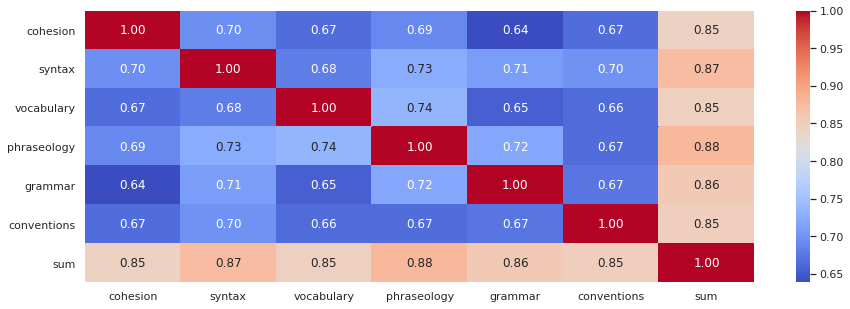

In [6]:
LABEL_COLUMNS  = ['cohesion', 'syntax', 'vocabulary', 'phraseology', 'grammar', 'conventions', 'sum']
corr = train_df[LABEL_COLUMNS].corr()
sns.set(rc = {"figure.figsize": (15, 5)})

sns.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, annot = True, cmap = "coolwarm", fmt = ".2f")
plt.show()

/usr/lib/python3/dist-packages/seaborn/axisgrid.py:2092: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


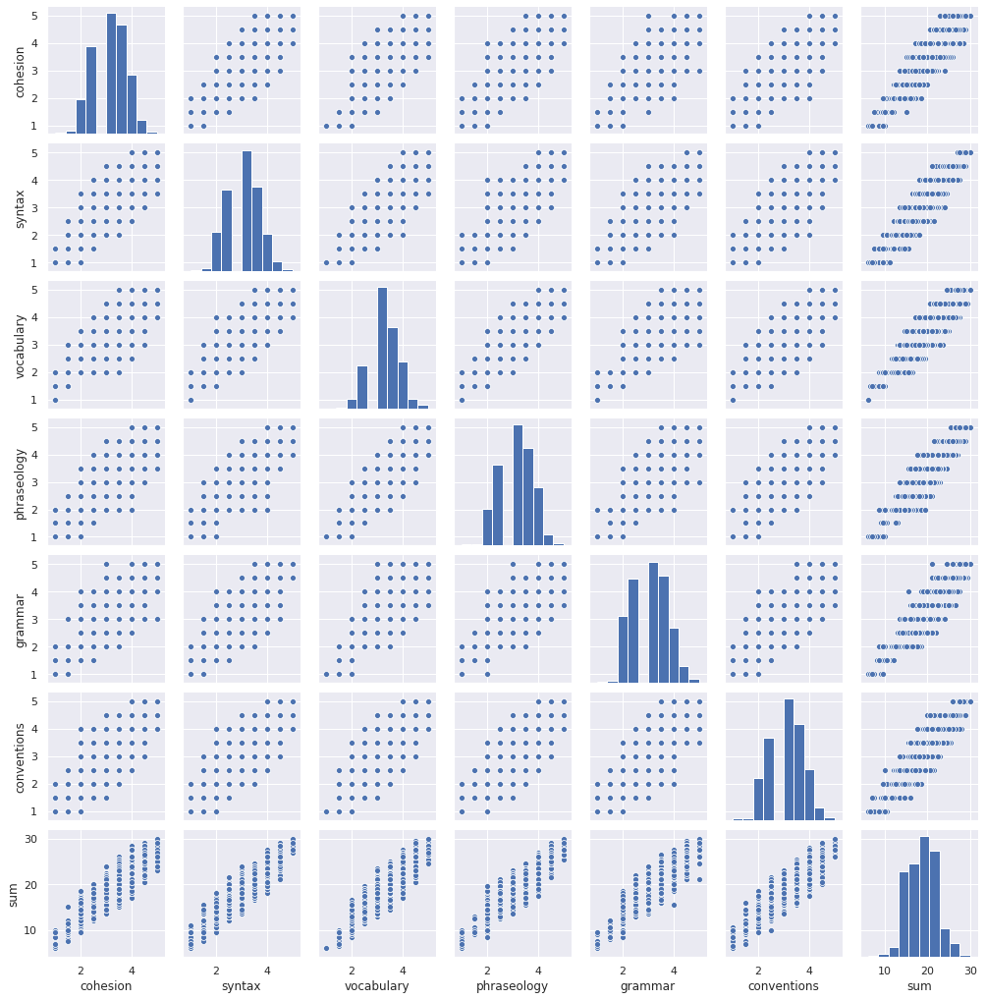

In [7]:
sns.pairplot(train_df, size=2)

In [8]:
import nltk

テキストの前処理

In [9]:
train_df['full_text_pre'] = train_df['full_text'].str.replace('\n', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace('\r', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace('.', ' ')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace(',', ' ')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace('!', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace('?', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace('"', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace(':', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace(';', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace('\d+', '')
train_df['full_text_pre'] = train_df['full_text_pre'].str.replace('  ', ' ')
train_df['full_text_pre'] = train_df['full_text_pre'].astype(str)


ミススペルのカウント

In [10]:
from spellchecker import SpellChecker

spell = SpellChecker()

In [11]:
def misspell_count(text):
    
    text_words = text.split()
    misspelled = spell.unknown(text_words)
    count = 0
    for word in misspelled:
        # 一文字をミススペルに入れた方が相関係数が高い
        #if len(word) == 1:
         #   count = count
        # 数字が含まれる時はカウントしない
        # 数字が含まれているものも未知語としてカウントされるため
        if any(chr.isdigit() for chr in word):
            count = count
        else:
            count += 1
            # スペルミス
            #print(word)
        # 最も可能性の高い単語
        #print(spell.correction(word))
    #print(count)
    return count 

In [12]:
text = train_df['full_text_pre']

In [13]:
miss_count = []

for i in range(3911):
    check_text = text[i]
    m_count = misspell_count(check_text)
    miss_count.append(m_count)

In [14]:
word_num =  []
unique_word_num = []
for i in range(3911):
    check_text = text[i].split()
    word_num.append(len(check_text))
    unique_word_num.append(len(set(check_text)))

In [15]:
train_df['word_num'] = word_num
train_df['unique_word_num'] = unique_word_num
train_df['miss_count'] = miss_count

In [16]:
train_df['unique_word_num_not_miss_count'] = train_df['unique_word_num'] - train_df['miss_count']

In [17]:
train_df.columns

Index(['text_id', 'full_text', 'cohesion', 'syntax', 'vocabulary',
       'phraseology', 'grammar', 'conventions', 'sum', 'full_text_pre',
       'word_num', 'unique_word_num', 'miss_count',
       'unique_word_num_not_miss_count'],
      dtype='object')

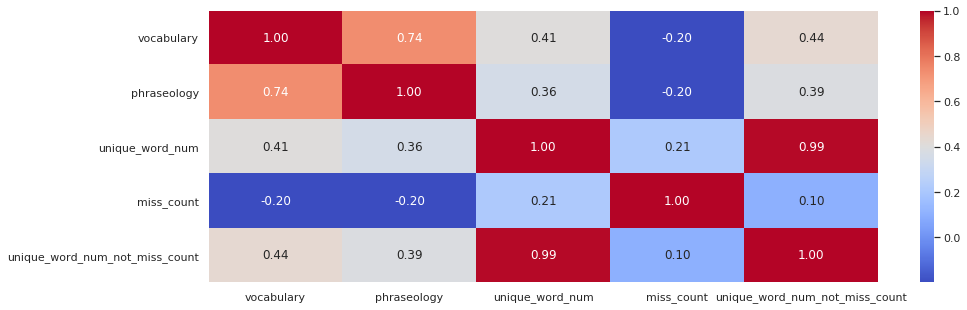

In [18]:
LABEL_COLUMNS  = [ 'vocabulary', 'phraseology', 'unique_word_num', 'miss_count', 'unique_word_num_not_miss_count']
corr = train_df[LABEL_COLUMNS].corr()
sns.set(rc = {"figure.figsize": (15, 5)})

sns.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, annot = True, cmap = "coolwarm", fmt = ".2f")
plt.show()

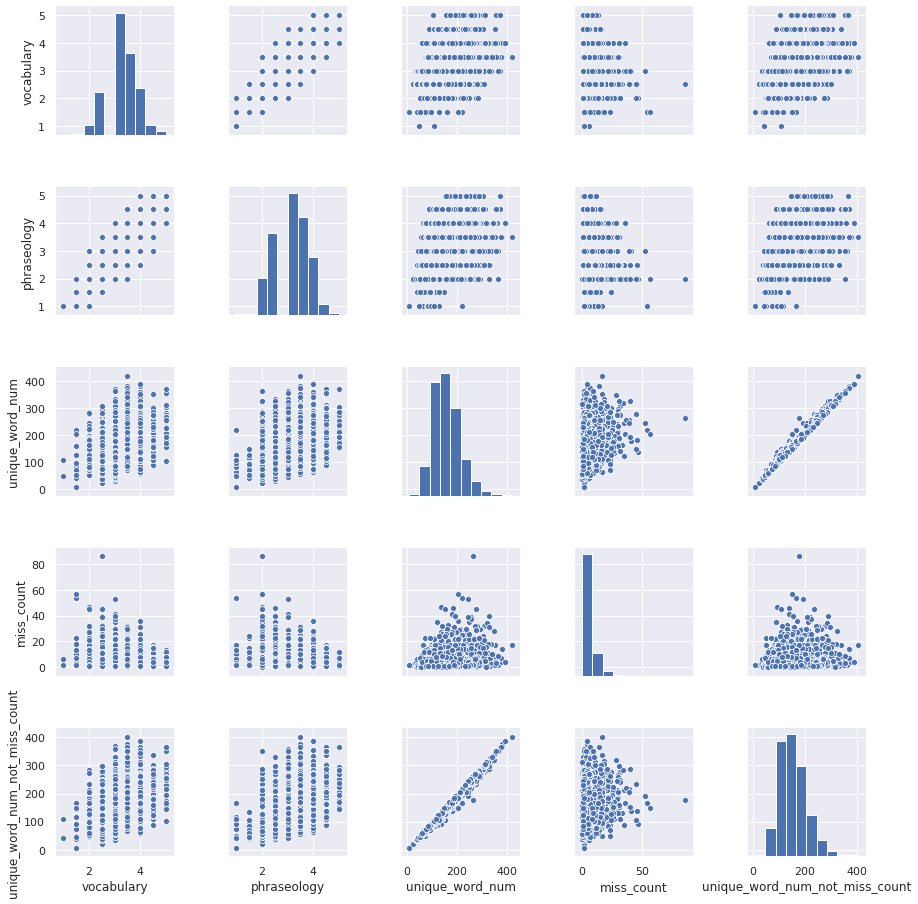

In [19]:
sns.pairplot(train_df[LABEL_COLUMNS])

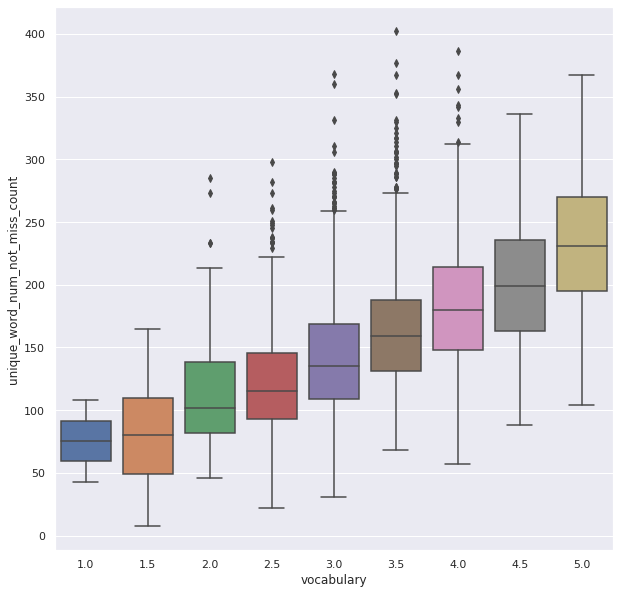

In [20]:
plt.figure(figsize=(10, 10))
#plt.scatter(x, y)
sns.boxplot(x="vocabulary", y="unique_word_num_not_miss_count", data = train_df)

tf-idf

In [21]:

from sklearn.feature_extraction.text import TfidfVectorizer #
from sklearn.decomposition import TruncatedSVD #
from sklearn.metrics.pairwise import cosine_similarity

In [22]:
tv = TfidfVectorizer(ngram_range=(1,2))

In [23]:
X = tv.fit_transform(train_df['full_text_pre'])

In [24]:
n_components = 20
svd = TruncatedSVD(n_components=n_components)
X = svd.fit_transform(X)

In [25]:
# 特徴量作成　（正規化された値を出力）
description_ = pd.DataFrame(X, columns=[f"tfidf_{i}" for i in range(n_components)])
description_

,tfidf_0,tfidf_1,tfidf_2,tfidf_3,tfidf_4,tfidf_5,tfidf_6,tfidf_7,tfidf_8,tfidf_9,tfidf_10,tfidf_11,tfidf_12,tfidf_13,tfidf_14,tfidf_15,tfidf_16,tfidf_17,tfidf_18,tfidf_19
0,0.276501,-0.049207,-0.096641,0.041006,-0.076361,0.058668,-0.043053,-0.009322,0.053038,0.007577,0.028388,-0.027138,0.027799,0.023333,-0.020504,0.022866,0.026234,-0.000383,0.050262,-0.012955
1,0.366874,0.118392,-0.033079,-0.048793,0.035653,0.015407,-0.026391,0.109088,-0.002943,-0.000023,0.059691,-0.012521,0.017495,-0.034856,0.001274,0.020689,-0.001227,-0.030450,0.022113,-0.003835
2,0.228654,-0.093117,-0.002299,0.004424,0.019815,0.004523,-0.031177,-0.024269,-0.006793,-0.070343,-0.059599,-0.019217,-0.019918,0.032376,-0.040092,0.028390,-0.011910,0.036463,0.070911,-0.035275
3,0.412742,0.165853,-0.126852,-0.006477,0.008872,0.038095,0.001302,-0.025736,0.024549,-0.078197,-0.059082,-0.033500,-0.072346,-0.010190,-0.023832,-0.059026,0.027554,0.036725,-0.057396,-0.061183
4,0.214564,0.126776,-0.063385,0.002961,-0.027939,0.047396,0.005993,0.053781,-0.015868,-0.055373,0.019731,0.016893,-0.027506,0.008126,0.029941,-0.004536,-0.016753,-0.008654,0.011308,0.009264
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3906,0.138116,-0.042956,0.051248,-0.048031,-0.014158,0.021119,0.000510,-0.042519,0.006796,-0.002560,0.000804,0.023264,0.071351,-0.044895,-0.021039,-0.015161,0.044483,-0.021488,0.008960,0.010891
3907,0.316296,-0.143191,0.019094,-0.030828,-0.135426,-0.180490,0.165537,0.052187,0.036527,0.007389,-0.006090,0.026999,-0.004430,0.019221,-0.018800,0.018680,0.067649,0.002023,-0.054598,-0.009272
3908,0.240729,0.127549,-0.095840,0.000445,-0.019289,0.016195,-0.024766,-0.011072,-0.013244,0.021525,-0.011908,0.000235,0.025532,0.000742,-0.005167,-0.006503,0.034039,-0.002137,-0.013266,-0.014560
3909,0.319930,0.137365,-0.030177,-0.029950,0.005717,0.022144,0.020968,0.042610,0.037264,-0.008691,-0.044203,-0.007083,-0.059710,-0.025512,0.007270,-0.082962,0.022946,-0.002244,-0.107999,-0.013762


In [26]:
train_df = pd.merge(train_df, description_, left_index=True, right_index=True)

In [27]:
train_df.head()

,text_id,full_text,cohesion,syntax,vocabulary,phraseology,grammar,conventions,sum,full_text_pre,...,tfidf_10,tfidf_11,tfidf_12,tfidf_13,tfidf_14,tfidf_15,tfidf_16,tfidf_17,tfidf_18,tfidf_19
0,0016926B079C,I think that students would benefit from learn...,3.5,3.5,3.0,3.0,4.0,3.0,20.0,I think that students would benefit from learn...,...,0.028388,-0.027138,0.027799,0.023333,-0.020504,0.022866,0.026234,-0.000383,0.050262,-0.012955
1,0022683E9EA5,When a problem is a change you have to let it ...,2.5,2.5,3.0,2.0,2.0,2.5,14.5,When a problem is a change you have to let it ...,...,0.059691,-0.012521,0.017495,-0.034856,0.001274,0.020689,-0.001227,-0.030450,0.022113,-0.003835
2,00299B378633,"Dear, Principal\n\nIf u change the school poli...",3.0,3.5,3.0,3.0,3.0,2.5,18.0,Dear PrincipalIf u change the school policy of...,...,-0.059599,-0.019217,-0.019918,0.032376,-0.040092,0.028390,-0.011910,0.036463,0.070911,-0.035275
3,003885A45F42,The best time in life is when you become yours...,4.5,4.5,4.5,4.5,4.0,5.0,27.0,The best time in life is when you become yours...,...,-0.059082,-0.033500,-0.072346,-0.010190,-0.023832,-0.059026,0.027554,0.036725,-0.057396,-0.061183
4,0049B1DF5CCC,Small act of kindness can impact in other peop...,2.5,3.0,3.0,3.0,2.5,2.5,16.5,Small act of kindness can impact in other peop...,...,0.019731,0.016893,-0.027506,0.008126,0.029941,-0.004536,-0.016753,-0.008654,0.011308,0.009264


In [28]:
train_df.columns

Index(['text_id', 'full_text', 'cohesion', 'syntax', 'vocabulary',
       'phraseology', 'grammar', 'conventions', 'sum', 'full_text_pre',
       'word_num', 'unique_word_num', 'miss_count',
       'unique_word_num_not_miss_count', 'tfidf_0', 'tfidf_1', 'tfidf_2',
       'tfidf_3', 'tfidf_4', 'tfidf_5', 'tfidf_6', 'tfidf_7', 'tfidf_8',
       'tfidf_9', 'tfidf_10', 'tfidf_11', 'tfidf_12', 'tfidf_13', 'tfidf_14',
       'tfidf_15', 'tfidf_16', 'tfidf_17', 'tfidf_18', 'tfidf_19'],
      dtype='object')

In [29]:
LABEL_COLUMNS = ['vocabulary','phraseology', 'tfidf_0', 'tfidf_1', 'tfidf_2',
       'tfidf_3', 'tfidf_4', 'tfidf_5', 'tfidf_6', 'tfidf_7', 'tfidf_8',
       'tfidf_9', 'tfidf_10', 'tfidf_11', 'tfidf_12', 'tfidf_13', 'tfidf_14',
       'tfidf_15', 'tfidf_16', 'tfidf_17', 'tfidf_18', 'tfidf_19']

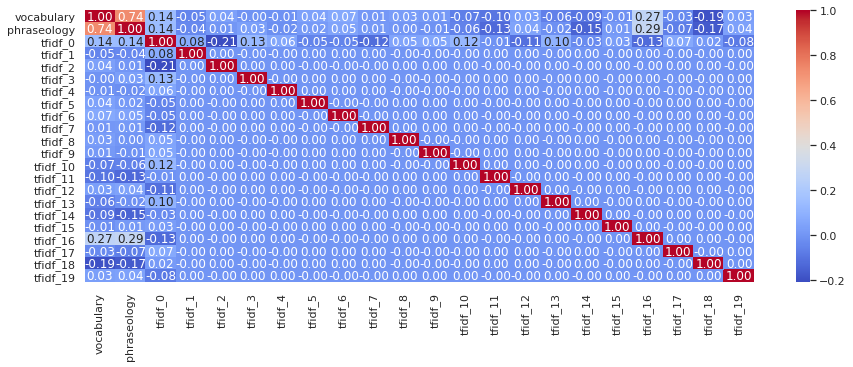

In [30]:
corr = train_df[LABEL_COLUMNS].corr()
sns.set(rc = {"figure.figsize": (15, 5)})

sns.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, annot = True, cmap = "coolwarm", fmt = ".2f")
plt.show()

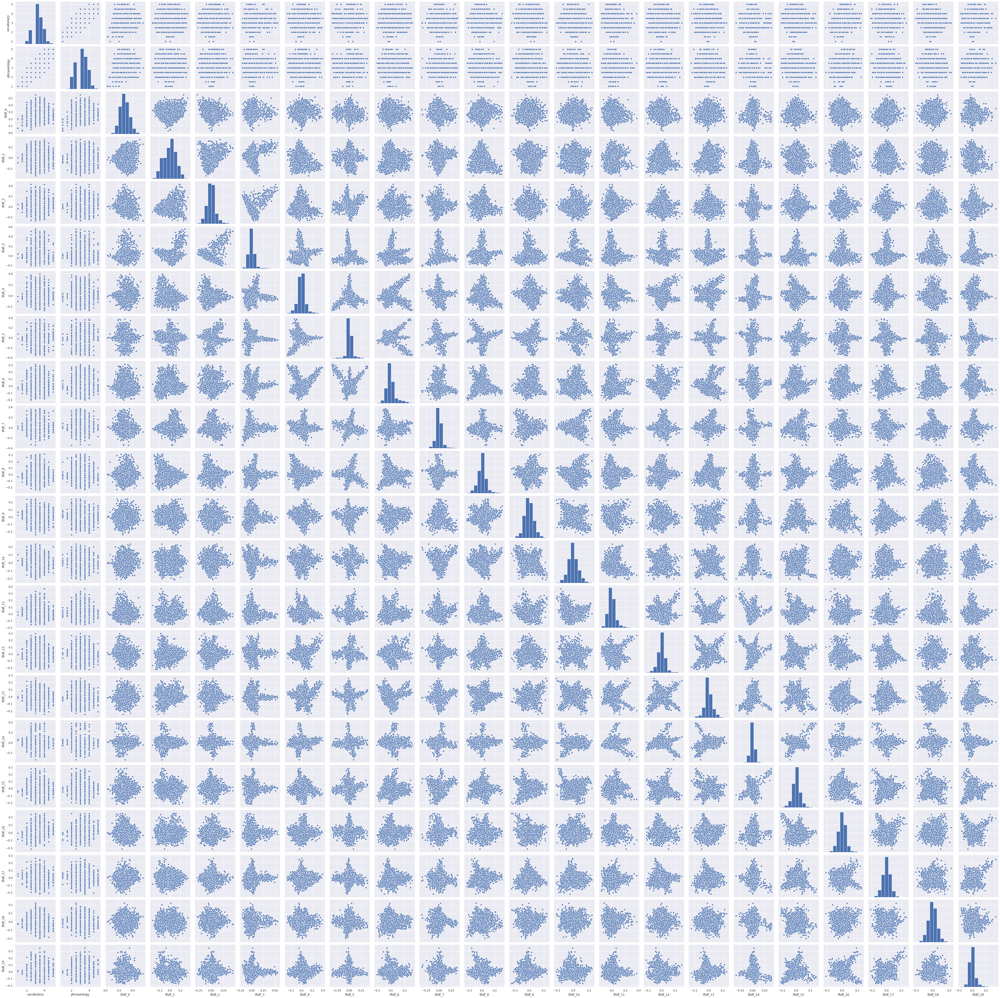

In [31]:
sns.pairplot(train_df[LABEL_COLUMNS])

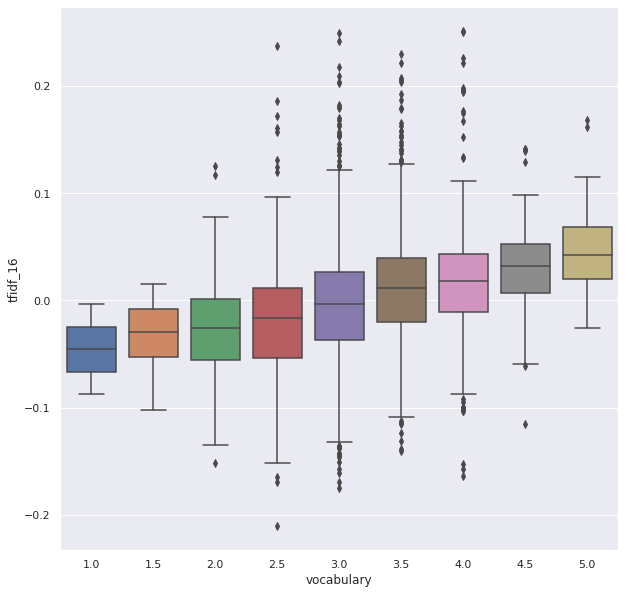

In [32]:
plt.figure(figsize=(10, 10))
#plt.scatter(x, y)
sns.boxplot(x="vocabulary", y="tfidf_16", data = train_df)

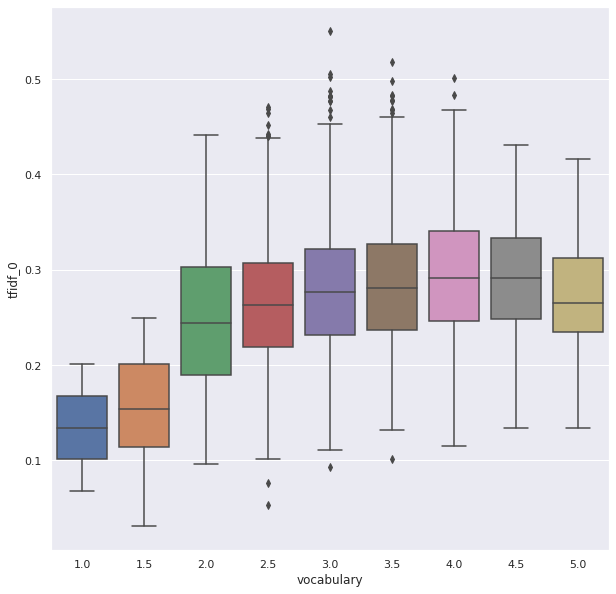

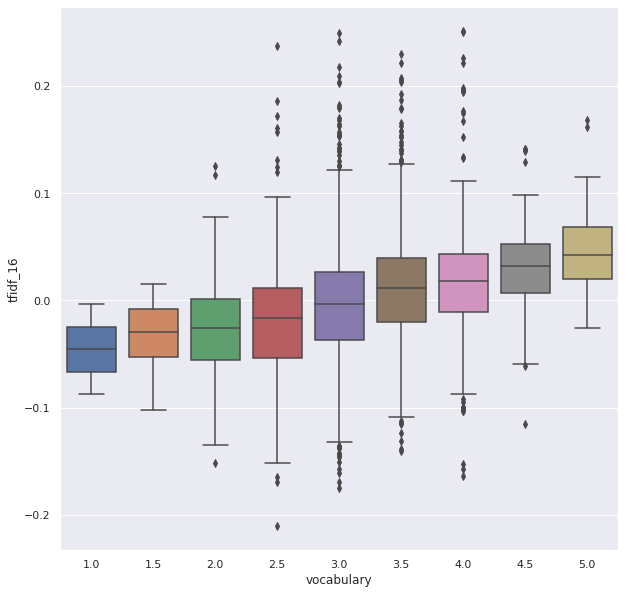

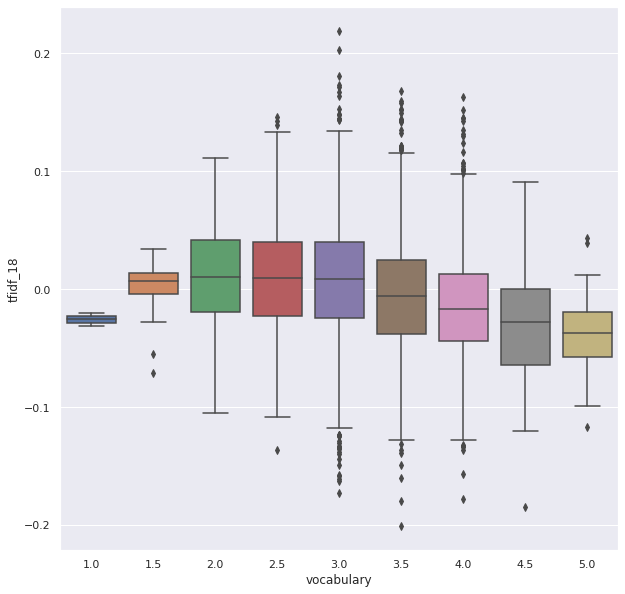

In [33]:
tf_list = ["tfidf_0","tfidf_16","tfidf_18"]

for i in tf_list:
    #plt.scatter(x, y)
    plt.figure(figsize=(10, 10))
    sns.boxplot(x="vocabulary", y=i, data = train_df)

形態素解析

In [34]:
from tqdm import tqdm

In [35]:
def _morphological_analysis_cc(text):
    cc = []

    # 単語に分解
    morph = nltk.word_tokenize(text)
    for word, tag in nltk.pos_tag(morph):

        # 1文字の単語は除外
        if len(word) <= 1:
            continue

        # 見出し語
        if tag.startswith('CC'):  # 接続詞
            cc.append(word)
        

    # スペース区切りで出力
    return " ".join(cc)

In [36]:
train_df["CC_tokenized"] = [_morphological_analysis_cc(text) for text in tqdm(train_df["full_text_pre"])]

100%|██████████| 3911/3911 [00:57<00:00, 68.51it/s]


In [37]:
cc_text =train_df['CC_tokenized']

In [38]:
cc_num = []
unique_cc_num = []
for i in range(3911):
    cc_num.append(len(cc_text[i]))
    unique_cc_num.append(len(set(cc_text[i])))
train_df['cc_num'] = cc_num
train_df['unique_cc_num'] = unique_cc_num

In [39]:
LABEL_COLUMNS = ['vocabulary','phraseology','cc_num', 'unique_cc_num']

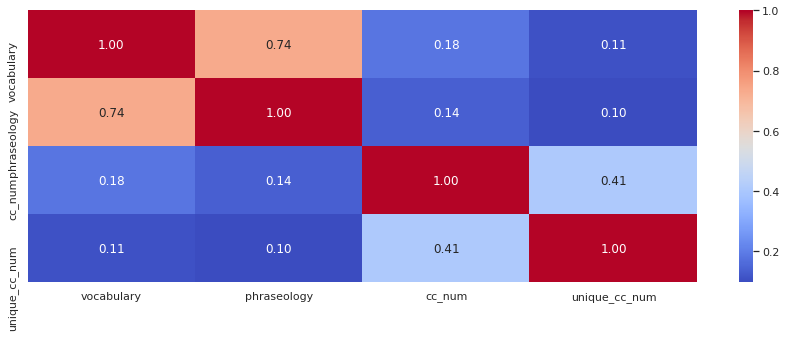

In [40]:
corr = train_df[LABEL_COLUMNS].corr()
sns.set(rc = {"figure.figsize": (15, 5)})

sns.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, annot = True, cmap = "coolwarm", fmt = ".2f")
plt.show()

lightgbmを用いたvocabraryの評価

In [41]:
import lightgbm as lgbm
from sklearn.model_selection import train_test_split

In [42]:
x = train_df[['word_num','miss_count','unique_word_num','unique_word_num_not_miss_count','tfidf_0',
       'tfidf_1', 'tfidf_2', 'tfidf_3', 'tfidf_4', 'tfidf_5',
       'tfidf_6', 'tfidf_7', 'tfidf_8', 'tfidf_9', 'tfidf_10', 'tfidf_11',
       'tfidf_12', 'tfidf_13', 'tfidf_14', 'tfidf_15', 'tfidf_16', 'tfidf_17',
       'tfidf_18', 'tfidf_19',
       'cc_num', 'unique_cc_num']]
y = train_df[['vocabulary']]

In [43]:
x_train,x_valid,y_train,y_valid = train_test_split(x,y,test_size = 0.3, random_state=3655)

In [45]:
categorical_features = []

#LightGBM用の訓練データセットを作成
lgb_train = lgbm.Dataset(x_train,y_train,categorical_feature=categorical_features,free_raw_data=False)
#LightGBM用の評価データセットを作成
lgb_eval = lgbm.Dataset(x_valid,y_valid,reference=lgb_train,categorical_feature=categorical_features,free_raw_data=False)


#ハイパーパラメータを設定
params = {
    'boosting_type': 'gbdt',

    #'objective': 'binary', 二値分類
    'objective': 'regression', #回帰
    
    'metric':'rmse',
    #'metric': {'l2', 'l1'}, 

    'num_leaves': 10,
    'learning_rate': 0.05,
    #'feature_fraction': 0.9,
    #'bagging_fraction': 0.8,
    #'bagging_freq': 5,
    #'vervose': 0
    
}

#LightGBMの学習
lgbm_model = lgbm.train(params,lgb_train,
                 valid_sets=[lgb_train,lgb_eval],
                 verbose_eval=10,
                 num_boost_round=200,
                 early_stopping_rounds= 20)

#最もスコアの良いモデルの保存
optimum_boost_rounds = lgbm_model.best_iteration

#LightGBMの予測
y_pred = lgbm_model.predict(x_valid,num_interation=lgbm_model.best_iteration)

/home/masa/.local/lib/python3.8/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
/home/masa/.local/lib/python3.8/site-packages/lightgbm/basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')
/home/masa/.local/lib/python3.8/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.248572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6068
[LightGBM] [Info] Number of data points in the train set: 2737, number of used features: 26
[LightGBM] [Info] Start training from score 3.230727
Training until validation scores don't improve for 20 rounds
[10]	training's rmse: 0.527119	valid_1's rmse: 0.52837
[20]	training's rmse: 0.495766	valid_1's rmse: 0.505346
[30]	training's rmse: 0.476261	valid_1's rmse: 0.492663
[40]	training's rmse: 0.462597	valid_1's rmse: 0.486026
[50]	training's rmse: 0.451981	valid_1's rmse: 0.48182
[60]	training's rmse: 0.443486	valid_1's rmse: 0.479074
[70]	training's rmse: 0.436375	valid_1's rmse: 0.478183
[80]	training's rmse: 0.430425	valid_1's rmse: 0.477358
[90]	training's rmse: 0.425053	valid_1's rmse: 0.477232
[100]	training's rmse: 0.41961	valid_1's rmse: 0.477039
[110]	training's rmse: 0.414754	valid

lightgbmを用いたsyntaxの評価

In [46]:
x = train_df[['word_num','miss_count','unique_word_num','unique_word_num_not_miss_count','tfidf_0',
       'tfidf_1', 'tfidf_2', 'tfidf_3', 'tfidf_4', 'tfidf_5',
       'tfidf_6', 'tfidf_7', 'tfidf_8', 'tfidf_9', 'tfidf_10', 'tfidf_11',
       'tfidf_12', 'tfidf_13', 'tfidf_14', 'tfidf_15', 'tfidf_16', 'tfidf_17',
       'tfidf_18', 'tfidf_19',
       'cc_num', 'unique_cc_num']]
y = train_df[['syntax']]

In [47]:
x_train,x_valid,y_train,y_valid = train_test_split(x,y,test_size = 0.3, random_state=3655)

In [48]:
categorical_features = []

#LightGBM用の訓練データセットを作成
lgb_train = lgbm.Dataset(x_train,y_train,categorical_feature=categorical_features,free_raw_data=False)

#LightGBM用の評価データセットを作成
lgb_eval = lgbm.Dataset(x_valid,y_valid,reference=lgb_train,categorical_feature=categorical_features,free_raw_data=False)


#ハイパーパラメータを設定
params = {
    'boosting_type': 'gbdt',

    #'objective': 'binary', 二値分類
    'objective': 'regression', #回帰
    
    'metric':'rmse',
    #'metric': {'l2', 'l1'}, 

    'num_leaves': 10,
    'learning_rate': 0.05,
    #'feature_fraction': 0.9,
    #'bagging_fraction': 0.8,
    #'bagging_freq': 5,
    #'vervose': 0
    
}

#LightGBMの学習
lgbm_model = lgbm.train(params,lgb_train,
                 valid_sets=[lgb_train,lgb_eval],
                 verbose_eval=10,
                 num_boost_round=200,
                 early_stopping_rounds= 20)

#最もスコアの良いモデルの保存
optimum_boost_rounds = lgbm_model.best_iteration

#LightGBMの予測
y_pred = lgbm_model.predict(x_valid,num_interation=lgbm_model.best_iteration)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6068
[LightGBM] [Info] Number of data points in the train set: 2737, number of used features: 26
[LightGBM] [Info] Start training from score 3.014432
Training until validation scores don't improve for 20 rounds
[10]	training's rmse: 0.59758	valid_1's rmse: 0.594479
[20]	training's rmse: 0.568514	valid_1's rmse: 0.574568
[30]	training's rmse: 0.548503	valid_1's rmse: 0.563557
[40]	training's rmse: 0.533936	valid_1's rmse: 0.556641
[50]	training's rmse: 0.522265	valid_1's rmse: 0.551645
[60]	training's rmse: 0.512428	valid_1's rmse: 0.549536
[70]	training's rmse: 0.50374	valid_1's rmse: 0.547693
[80]	training's rmse: 0.496026	valid_1's rmse: 0.546271
[90]	training's rmse: 0.48941	valid_1's rmse: 0.545305
[100]	training's rmse: 0.483076	valid_1's rmse: 0.544047
[110]	training's rmse: 0.477248	valid